# Circuit Topology predicts protein compaction

In this code a model is build that predicts the  Flory exponent of proteins. This model is a sigmoidal regression model that uses topological parameters. In the first part of the notebook, dataframes PED and SCOPe are created, with CT contacts, and gamma / R0 fitting. This part should be run for PED (trajectory 1) or SCOPe (trajectory 2) on by one, whereafter the two dataframes can be merged together. Only proteins with less than 200 residues are used to train the model. The prediction model is built in the last part of the code whereafter it is also validated on proteins bigger than 200 residues. Before using this notebook, the corresponding preprocess notebook needs to be used, in order to create the correct dataframes and trajectories. 

## Importing libraries

In [1]:
import numpy as np
import os
import pandas as pd

from scipy import ndimage
from scipy.signal import savgol_filter
from scipy.stats import linregress

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import mdtraj as md
import MDAnalysis as mda

import nglview as nv
import itertools

import plotly.graph_objects as go
import plotly.express as px
import plotly.subplots as sp
import pickle

from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from scipy.optimize import curve_fit
from plotly.subplots import make_subplots

## Function for plot styling

In [2]:
PLOT_WIDTH = 540
PLOT_HEIGHT = 430
TITLE_FONT_SIZE = int(38)
TICK_FONT_SIZE = int(38)
def style_plot(
    fig,
    x_title="",
    y_title="",
    x_range=None,
    y_range=None,
    x_type="linear",
    y_type="linear",
    colorbar_title="Gamma",
    colorbar_dtick=None,
    colorbar_len=1.0,
    colorbar_x=1.02,
    colorbar_xanchor="left",
    tickvals=None
):
    fig.update_traces(marker=dict(opacity=0.6))

    fig.update_layout(
        plot_bgcolor="white",
        width=PLOT_WIDTH,
        height=PLOT_HEIGHT,
        xaxis=dict(
            title=dict(text=x_title, font=dict(family="Arial", size=TITLE_FONT_SIZE, color="black")),
            tickfont=dict(family="Arial", size=TICK_FONT_SIZE, color="black"),
            showgrid=False,
            zeroline=False,
            mirror=True,
            linecolor="black",
            linewidth=2,
            type=x_type,
            dtick=1 if x_type == "log" else None,
            exponentformat="power" if x_type == "log" else None,
            range=x_range,
            **({"tickvals": tickvals} if tickvals is not None else {})
        ),
        yaxis=dict(
            title=dict(text=y_title, font=dict(family="Arial", size=TITLE_FONT_SIZE, color="black")),
            tickfont=dict(family="Arial", size=TICK_FONT_SIZE, color="black"),
            showgrid=False,
            zeroline=False,
            mirror=True,
            linecolor="black",
            linewidth=2,
            type=y_type,
            dtick=4,
            # if y_type == "log" else None,
            exponentformat="power" if y_type == "log" else None,
            range=y_range,
            **({"tickvals": tickvals} if tickvals is not None else {})
        ),
        coloraxis_colorbar=dict(
            title=dict(text=colorbar_title, font=dict(family="Arial", size=TITLE_FONT_SIZE, color="black")),
            tickfont=dict(family="Arial", size=TICK_FONT_SIZE, color="black"),
            thickness=20,
            tickmode="linear",
            len=colorbar_len,
            x=colorbar_x,
            xanchor=colorbar_xanchor,
            **({"dtick": colorbar_dtick} if colorbar_dtick is not None else {})
        )
    )
    fig.update_coloraxes(colorbar_title_side='right')
    return fig

## Functions

In [3]:
# This function is used for secondary structure analysis. It transforms letters in vector to numbers. 
# The letters corresponds to simplified form of DSSP secondary structure. C-cross, H-helix, E-elongated
def letters_to_numbers(vector):
    a = np.zeros(vector.shape)
    a[vector == 'C'] = 0
    a[vector == 'H'] = 1
    a[vector == 'E'] = 2
    return a
# This function is used for gamma and R0 calculations
def fit_gamma_R0(traj):
    # Get number of residues
    n_residues = traj.topology.n_residues
    
    # Get number of unique pairs
    pairs = list(itertools.combinations(range(n_residues), 2))
    distances_tuple = md.compute_contacts(traj, pairs)

    distances = distances_tuple[0] # Extract only first element of tuple (distances)

    if distances.ndim == 1:
        distances = distances.reshape(1, -1)
    
    # Convert to square convert map
    contact_map = md.geometry.squareform(distances, np.array(pairs))

    
    # If necessary, average between frames
    if contact_map.ndim == 3:
        contact_map = np.average(contact_map, axis = 0)

    pairs = []
    distances = []

    for i in range(n_residues):
        for j in range(i + 1, n_residues):
            distance = contact_map[i, j]
            pairs.append((i, j))
            distances.append(distance)

    # Convert pairs to numerical representation using |j - i|
    x = np.array([abs(j - i) for i, j in pairs])

    # Convert distances to a NumPy array
    y = np.array(distances)

    #average between save x
    x1, y1 = [], []
    for x_uniq in np.unique(x):
        x1.append(x_uniq)
        y1.append(np.average(y[x==x_uniq]))

    
    coeff = np.polyfit(np.log10(x1), np.log10(y1), 1)
    gamma = coeff[0]
    intercept = coeff[1]
    R0 = np.exp(intercept)
    
    print(f"Estimated R0: {R0}")
    print(f"Estimated gamma: {gamma}")
    
    return gamma, R0

## Prepare data work frame and read in files

This code should be run to create dataframe for PED and SCOPe seperately (changing the trajectory and names: 1 for PED, 2 for SCOPe, and psc results file). Run all codes for one dataset first (and save) before starting the second dataset.

In [4]:
CT_csv_path = '/CT_analysis/CT_input'
PDB_traj_path = '/CT_analysis/trajectory'

In [5]:
# Load in SCOPe_df with CT contacts from ProteinCT
df_list = []

names = {
        # 1: 'IDPs',
        2: 'SCOPe'
        }
# Read csv files from CT_input and create df
for i, value in names.items():
    df = pd.read_csv('{}/SCOPe_pscresults_neighbours=2.csv'.format(CT_csv_path,i)) 
    df[['Protid', 'Ensemble', 'Frame', 'Chain']] = df['protid'].str.split(r'[_\.]', expand=True)
    df = df.drop(columns=['Chain'])
    df = df.sort_values(by=['Protid', 'Ensemble','Frame'],ignore_index=True)
    df = df.set_index('Unnamed: 0')
    df = df.reset_index(drop=True)
    df['Entangled'] = df['C']+df['P']
    df['Molecule'] = len(df)*[value]
    df = df[['Protid', 'Ensemble', 'Frame','P', 'S', 'C','Entangled', 'Molecule', 'protid' ]]
    df.rename(columns={'C': 'X'}, inplace=True)
    #Append all df to df_list
    df_list.append(df)

# Combines df list and makes single df + resets columns 
df = pd.concat(df_list, ignore_index=True)

#Create new max_frames column
df['Frame'] = pd.to_numeric(df['Frame'], errors='coerce')
df['Frame'] = df['Frame'] + 1
df['Max_Frame'] = df.groupby(['Protid', 'Ensemble'])['Frame'].transform('max')
df['Weight'] = 1 / (df['Max_Frame'])
df

FileNotFoundError: [Errno 2] No such file or directory: '/CT_analysis/CT_input/SCOPe_pscresults_neighbours=2.csv'

## Calculate gamma and R0

The gamma and R0 is calculated per protein by first joining the trajectories. This is done for PED and SCOPe database seperately.

In [7]:
# Use trajectory 1 for PED, 2 for SCOPe, 5 for MERGED
base_path = '/CT_analysis/trajectory/2'

gamma_dict = {}
R0_dict = {}

for prot_name in df[:].Protid.unique():
    pdbs = list(df[df['Protid'] == prot_name]['protid'])
    pdb_list = ['{}/{}.pdb'.format(base_path, pdb[:-2]) for pdb in pdbs]

    trajs = []
    ref_n_atoms = None

    for pdb_file in pdb_list:
        try:
            traj = md.load(pdb_file)
            if ref_n_atoms is None:
                ref_n_atoms = traj.n_atoms
                trajs.append(traj)
            elif traj.n_atoms == ref_n_atoms:
                trajs.append(traj)
            else:
                print(f"[{prot_name}] Skipping {pdb_file}: {traj.n_atoms} atoms (expected {ref_n_atoms})")
        except Exception as e:
            print(f"[{prot_name}] Failed to load {pdb_file}: {e}")

    if trajs:
        try:
            traj = md.join(trajs)
            gamma, R0 = fit_gamma_R0(traj)
            print(f"[{prot_name}] Successfully joined {len(trajs)} trajectories.")
            gamma_dict[prot_name] = gamma
            R0_dict[prot_name] = R0
        except Exception as e:
            print(f"[{prot_name}] Failed to join trajectories: {e}")
    else:
        print(f"[{prot_name}] No compatible trajectories to join.")

Estimated R0: 0.8896194700952198
Estimated gamma: 0.2298675760226747
[16VP] Successfully joined 1 trajectories.
Estimated R0: 0.643673549352191
Estimated gamma: 0.22879494398817013
[1A1X] Successfully joined 1 trajectories.
Estimated R0: 0.9435525484846576
Estimated gamma: 0.17236988161278546
[1AD2] Successfully joined 1 trajectories.
Estimated R0: 0.7085704186566716
Estimated gamma: 0.2133464309613625
[1AEP] Successfully joined 1 trajectories.
Estimated R0: 0.46802933666035523
Estimated gamma: 0.3746131990472119
[1AF7] Successfully joined 1 trajectories.
Estimated R0: 0.5246288119385147
Estimated gamma: 0.2070315642640918
[1AFP] Successfully joined 40 trajectories.
Estimated R0: 0.2759021517115322
Estimated gamma: 0.4315480563175878
[1ANS] Successfully joined 28 trajectories.
Estimated R0: 1.0535043160788609
Estimated gamma: 0.14134528400679297
[1AOL] Successfully joined 1 trajectories.
Estimated R0: 0.43638779371023717
Estimated gamma: 0.2903727455896682
[1B7C] Successfully joined 1 

In [111]:
# # Save gamma and R0 dictionary so it does not have to be loaded every time
# with open('/CT_analysis/Dataframes/PED_gamma_dict_v0.pkl', 'wb') as f:
#     pickle.dump(gamma_dict, f)
# with open('/CT_analysis/Dataframes/PED_R0_dict_v0.pkl', 'wb') as f:
#     pickle.dump(R0_dict, f)

In [8]:
# with open('/CT_analysis/Dataframes/SCOPe_gamma_dict_v0.pkl', 'wb') as f:
#     pickle.dump(gamma_dict, f)
# with open('/CT_analysis/Dataframes/SCOPe_R0_dict_v0.pkl', 'wb') as f:
#     pickle.dump(R0_dict, f)

### Find non-standard atom types and delete these lines

In [6]:
folder_path = '/CT_analysis/trajectory/2'
non_standard_atoms = ['VS', 'D']  # List of non-standard atom types to search for

for filename in os.listdir(folder_path):
    if filename.endswith('.pdb'):
        file_path = os.path.join(folder_path, filename)
        cleaned_lines = []  # Temporary list to store cleaned lines

        with open(file_path, 'r') as file:
            for line in file:
                if line.startswith(("ATOM", "HETATM")):
                    atom_type = line[76:78].strip()  # Atom type is typically in columns 77-78
                    if atom_type in non_standard_atoms:
                        print(f"Non-standard atom '{atom_type}' found and removed in {filename}")
                        continue  # Skip adding this line to cleaned_lines
                cleaned_lines.append(line)  # Add non-problematic lines

        # Overwrite the file with cleaned lines
        with open(file_path, 'w') as file:
            file.writelines(cleaned_lines)

print("Processing complete. Problematic lines removed from files.")

Processing complete. Problematic lines removed from files.


### Calculate Rg, SASA, Gamma, SS, gamma and R0

In [ ]:
# Run this block seperately for PED and SCOPe database
ss_aa = np.zeros((len(df),3))
gyr = []
sasa_t=[]
ss_list = []
residues_list = []
# Load these arrays for making PED dataframe
# with open('/CT_analysis/Dataframes/PED_gamma_dict_v0.pkl', 'rb') as f:
#     gamma_dict = pickle.load(f)
# with open('/CT_analysis/Dataframes/PED_R0_dict_v0.pkl', 'rb') as f:
#     R0_dict = pickle.load(f)
# Load these arrays for making SCOPe datafrmae
with open('/CT_analysis/Dataframes/SCOPe_gamma_dict_v0.pkl', 'rb') as f:
    gamma_dict = pickle.load(f)
with open('/CT_analysis/Dataframes/SCOPe_R0_dict_v0.pkl', 'rb') as f:
    R0_dict = pickle.load(f)

#Itterating over every protid in the PDB_traj folder
for index, row in df.iterrows():
    # Change to trajectory 1/2/5 depending on which dataframe
    a = list(names.keys())[list(names.values()).index(row['Molecule'])]
    pdb_path = '{}/2/{}.pdb'.format(PDB_traj_path,row['protid'][:-2])
        
    # this doesn't work on some files because some files contain residue 0. MDTRAJ can not load this
    pdb = md.load_pdb(pdb_path)
    ss = md.compute_dssp(pdb, simplified=True)
    ss_list.append(ss)
    values, counts = np.unique(ss, return_counts=True)
    ss_dict = dict(zip(values, counts))
    for i, ss_el in enumerate(['C','H','E']):
        if ss_el in ss_dict:
            ss_aa[index,i] = ss_dict[ss_el]
        else:
            ss_aa[index,i] = 0

    #Calculating the proteins radius of gyration
    u = mda.Universe(pdb_path)
    protein = u.select_atoms('protein or resname SEP')        
    gyr.append(protein.radius_of_gyration()/10)

    #Calculating SASA
    traj = md.load_pdb(pdb_path)
    sasa = md.shrake_rupley(traj)
    sasa_t.append(sasa)

    #Calculating the number of residues per protid
    traj = md.load_pdb(pdb_path)
    residues = traj.topology.n_residues
    residues_list.append(residues)

#This part adds every calculated parameter to the df
df['Gamma'] = df['Protid'].map(gamma_dict)
df['R0'] = df['Protid'].map(R0_dict)
df['SS vector'] = ss_list 
df['Coil'] = ss_aa[:,0]
df['Helix'] = ss_aa[:,1]
df['Elongated'] = ss_aa[:,2]
df['Rg, nm'] = gyr
df['SASA, nm^2'] = [np.sum(sst) for sst in sasa_t]
gyr = np.array(gyr)
df['Residues number'] = residues_list
gyr = np.array(gyr)
residues_list = np.array(residues_list)
df

### Save this df as CSV

In [114]:
# df.to_csv('/CT_analysis/Dataframes/PED_df_v0')

In [5]:
# SCOPe_df.to_csv('/CT_analysis/Dataframes/SCOPe_df_v0')

### Merge and prepare databases

In [10]:
PED_df = pd.read_csv('/CT_analysis/Dataframes/PED_df_v0', index_col=0)
SCOPe_df = pd.read_csv('/CT_analysis/Dataframes/SCOPe_df_v0', index_col=0)
merged_df = pd.concat([PED_df, SCOPe_df], ignore_index=True)

In [11]:
# merged_df.to_csv('/CT_analysis/Dataframes/MERGED_df_v0')

OSError: Cannot save file into a non-existent directory: '/Users/murielhammond/RP1/CT_code/CT_analysis/Dataframes/CT_analysis/Dataframes'

In [9]:
merged_df = pd.read_csv('/CT_analysis/Dataframes/MERGED_df_v0', index_col=0)

### Edit dataframe

In [10]:
merged_df = merged_df.drop(['Entangled', 'SS vector', 'Elongated'], axis=1)
merged_df = merged_df[(merged_df['Residues number'] > 10) & (merged_df['Max_Frame'] < 200)] 

merged_df = merged_df.rename(columns={'Helix': 'Helix residues \nnumber'}, errors="raise")
merged_df['Coil portion'] = merged_df['Coil']/merged_df['Residues number']
merged_df['Helix portion'] = merged_df['Helix residues \nnumber']/merged_df['Residues number']
merged_df['Elongated portion'] = (merged_df['Residues number'] - merged_df['Helix residues \nnumber'] - merged_df['Coil'])/merged_df['Residues number']
merged_df['Fixed_R0'] = 2.5
merged_df['Gamma_Fixed_R0'] = np.log(merged_df['Rg, nm']/0.25)/np.log(merged_df['Residues number'])
merged_df.loc[~(merged_df[['P', 'S', 'X']]==0).all(axis=1)]

merged_df["P_normalized"] = merged_df["P"]/(merged_df["Residues number"]**1.86*(10**(-0.40)))
merged_df["X_normalized"] = merged_df["X"]/(merged_df["Residues number"]**1.71*(10**(-0.50)))
merged_df["S_normalized"] = merged_df["S"]/(merged_df["Residues number"]**2.70*(10**(-1.81)))

merged_df[['log(P)', 'log(S)', 'log(X)']] = np.log(merged_df[['P', 'S', 'X']])
merged_df['total_contacts'] = merged_df['P'] + merged_df['S'] + merged_df['X']
merged_df = merged_df.drop_duplicates().replace([np.inf, -np.inf], np.nan).dropna()
merged_df

/opt/anaconda3/envs/CT_Folding_Score/lib/python3.12/site-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


,Protid,Ensemble,Frame,P,S,X,Molecule,protid,Max_Frame,Weight,...,Elongated portion,Fixed_R0,Gamma_Fixed_R0,P_normalized,X_normalized,S_normalized,log(P),log(S),log(X),total_contacts
0,PED00001,e001,1,511,635,180,IDPs,PED00001_e001.0_A,11,0.090909,...,0.000000,2.5,0.468014,0.285611,0.249572,0.204431,6.236370,6.453625,5.192957,1326
1,PED00001,e001,2,141,155,29,IDPs,PED00001_e001.1_A,11,0.090909,...,0.000000,2.5,0.460036,0.078809,0.040209,0.049900,4.948760,5.043425,3.367296,325
2,PED00001,e001,11,15,159,16,IDPs,PED00001_e001.10_A,11,0.090909,...,0.000000,2.5,0.594428,0.008384,0.022184,0.051188,2.708050,5.068904,2.772589,190
3,PED00001,e001,3,59,312,35,IDPs,PED00001_e001.2_A,11,0.090909,...,0.000000,2.5,0.464332,0.032977,0.048528,0.100445,4.077537,5.743003,3.555348,406
4,PED00001,e001,4,819,985,276,IDPs,PED00001_e001.3_A,11,0.090909,...,0.000000,2.5,0.452796,0.457761,0.382677,0.317109,6.708084,6.892642,5.620401,2080
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10468,7JJK,e001,1,988,4555,452,SCOPe,7JJK_e001.0_A,1,1.000000,...,0.000000,2.5,0.411675,0.894162,0.976083,2.951827,6.895683,8.423981,6.113682,5995
10469,7KJG,e001,1,35899,155888,7609,SCOPe,7KJG_e001.0_A,1,1.000000,...,0.000000,2.5,0.349797,1.764134,1.128492,1.471701,10.488465,11.956893,8.937087,199396
10470,7KR0,e001,1,10149,23842,2865,SCOPe,7KR0_e001.0_A,1,1.000000,...,0.177515,2.5,0.355398,1.830434,1.404230,1.486102,9.225130,10.079204,7.960324,36856
10471,7MTO,e001,1,4762,32821,2038,SCOPe,7MTO_e001.0_A,1,1.000000,...,0.159574,2.5,0.425152,0.704459,0.832519,1.534354,8.468423,10.398824,7.619724,39621


### Make excluded and average dataframe for SCOPe

In [11]:
excluded_SCOPe_df = SCOPe_df.copy()
excluded_SCOPe_df = excluded_SCOPe_df[(excluded_SCOPe_df['Residues number'] < 200)]
average_SCOPe_df = excluded_SCOPe_df.copy()
average_SCOPe_df = average_SCOPe_df.groupby('Protid')[['P', 'S', 'X','Residues number', 'Gamma', 'Weight', 'Max_Frame', 'Rg, nm']].mean()
average_SCOPe_df = average_SCOPe_df.reset_index(drop=False)
average_SCOPe_df

,Protid,P,S,X,Residues number,Gamma,Weight,Max_Frame,"Rg, nm"
0,1A1X,2709.000000,5042.000000,1294.000000,106.0,0.228795,1.000000,1.0,1.352720
1,1AEP,4441.000000,28133.000000,1356.000000,153.0,0.213346,1.000000,1.0,1.663496
2,1AFP,936.950000,541.300000,340.150000,51.0,0.207032,0.025000,40.0,1.014902
3,1ANS,158.321429,143.142857,93.107143,27.0,0.431548,0.035714,28.0,0.779732
4,1B7C,3212.000000,7473.000000,1250.000000,71.0,0.290373,1.000000,1.0,1.073089
...,...,...,...,...,...,...,...,...,...
306,7EQ4,4877.000000,4538.000000,1611.000000,113.0,0.127644,1.000000,1.0,1.318070
307,7JGW,3351.000000,20666.000000,1408.000000,145.0,0.400584,1.000000,1.0,1.717479
308,7JJK,988.000000,4555.000000,452.000000,71.0,0.496092,1.000000,1.0,1.445631
309,7KR0,10149.000000,23842.000000,2865.000000,169.0,0.239444,1.000000,1.0,1.547842


### Make excluded and average dataframe for PED

In [12]:
excluded_PED_df = PED_df.copy()
excluded_PED_df = excluded_PED_df[(excluded_PED_df['Residues number'] < 200)]
average_PED_df = excluded_PED_df.copy()
average_PED_df = average_PED_df.groupby('Protid')[['P', 'S', 'X','Residues number', 'Gamma', 'Weight', 'Max_Frame', 'Rg, nm']].mean()
average_PED_df = average_PED_df.reset_index(drop=False)
average_PED_df

,Protid,P,S,X,Residues number,Gamma,Weight,Max_Frame,"Rg, nm"
0,PED00001,140.437500,412.843750,59.531250,92.0,0.610853,0.093750,10.6875,2.747278
1,PED00004,206.600000,2181.461538,247.653846,69.0,0.803807,0.007692,130.0000,1.974152
2,PED00009,245.200000,1236.300000,171.200000,72.0,0.702330,0.100000,10.0000,1.895707
3,PED00013,68.500000,1244.020000,144.700000,71.0,0.698601,0.020000,50.0000,2.119272
4,PED00017,3.328205,40.323077,2.866667,130.0,0.646875,0.005128,195.0000,3.272931
...,...,...,...,...,...,...,...,...,...
216,PED00489,700.550000,1810.840000,342.510000,121.0,0.603688,0.010000,100.0000,2.491599
217,PED00496,4081.489796,14169.877551,1380.428571,191.0,0.376927,0.020408,49.0000,1.939458
218,PED00497,3963.063063,15841.180180,1592.801802,180.0,0.436336,0.009009,111.0000,2.102264
219,PED00507,1.750000,3.100000,0.600000,51.0,0.792744,0.050000,20.0000,2.092054


### Make excluded and average dataframe for MERGED

In [13]:
excluded_merged_df = merged_df.copy()
excluded_merged_df = excluded_merged_df[(excluded_merged_df['Residues number'] < 200)]
average_merged_df = excluded_merged_df.groupby('Protid')[['P', 'S', 'X', 'log(P)', 'log(S)', 'log(X)',
                                                         'Residues number', 'Gamma', 'Weight', 'Max_Frame', 'Rg, nm']].mean()
average_merged_df = average_merged_df.reset_index(drop=False)
mapping = excluded_merged_df.groupby('Protid')['Molecule'].first()
average_merged_df['Molecule'] = average_merged_df['Protid'].map(mapping)

In [14]:
# excluded_merged_df.to_csv('/CT_analysis/Dataframes/excluded_merged_df_v0')

## Plotting

### Rg vs res num

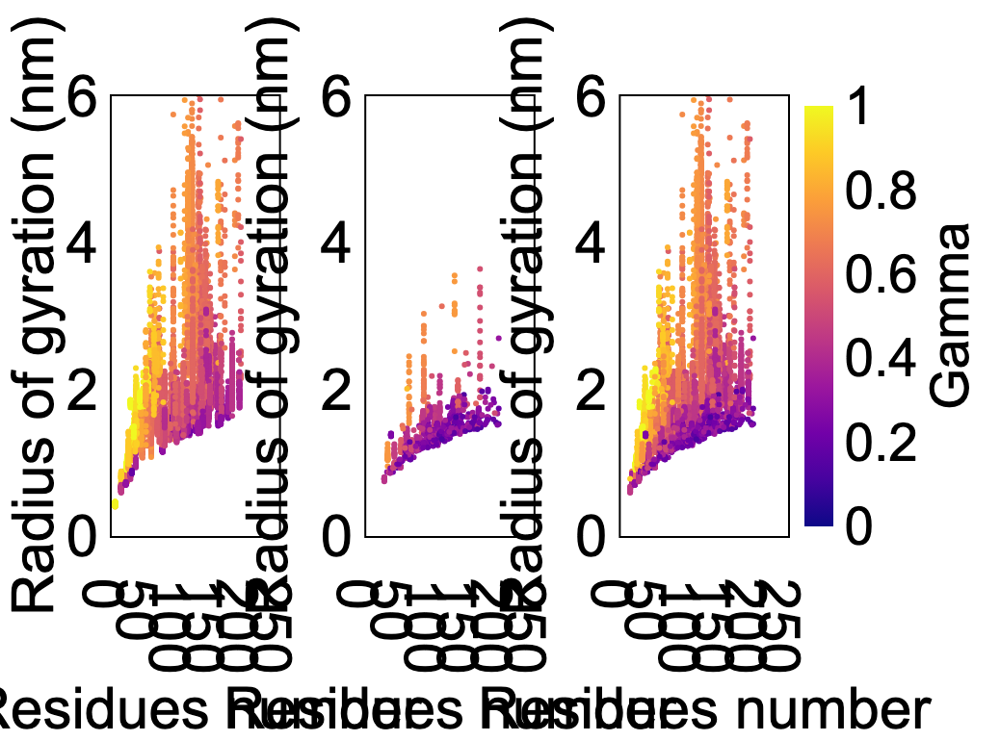

In [15]:
# Create the figure first
fig = make_subplots(rows=1, cols=3, horizontal_spacing=0.129)

colorscale = 'Plasma'

fig.add_trace(
    go.Scatter(
        x=excluded_PED_df["Residues number"],
        y=excluded_PED_df["Rg, nm"],
        mode='markers',
        marker=dict(
            color=excluded_PED_df["Gamma"],
            colorscale=colorscale,
            cmin=0,
            cmax=1,
            colorbar=dict(
                title='Gamma',
                title_side='right',
                title_font=dict(family="Arial", size=55, color="black"),
                tickfont=dict(family="Arial", size=55, color="black"),
                dtick=0.2,
                len=1,
                x=1.01,
                outlinewidth=0
            ),
            colorbar_len=1,
            size=6,
            showscale=True,
        ),
        hovertext=excluded_PED_df['Protid'],
        name=""
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=excluded_SCOPe_df["Residues number"],
        y=excluded_SCOPe_df["Rg, nm"],
        mode='markers',
        marker=dict(
            color=excluded_SCOPe_df["Gamma"],
            colorscale=colorscale,
            cmin=0,
            cmax=1,
            size=6,
            showscale=False,
        ),
        hovertext=excluded_SCOPe_df['Protid'],
        name=""
    ),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(
        x=excluded_merged_df["Residues number"],
        y=excluded_merged_df["Rg, nm"],
        mode='markers',
        marker=dict(
            color=excluded_merged_df["Gamma"],
            colorscale=colorscale,
            cmin=0,
            cmax=1,
            size=6,
            showscale=False,),
        hovertext=excluded_merged_df['Protid'],
        name=""
    ),
    row=1, col=3
)

TITLE_FONT_SIZE = 60
TICK_FONT_SIZE = 60

x_ranges = [[0, 250], [0, 250], [0, 250]]
y_ranges = [[0,6], [0, 6], [0, 6]]
x_titles = ["Residues number", "Residues number", "Residues number"]
y_titles = ["Radius of gyration (nm)", "Radius of gyration (nm)", "Radius of gyration (nm)"]

for i in range(3):
    fig.update_xaxes(
        title=dict(text=x_titles[i], font=dict(family="Arial", size=TITLE_FONT_SIZE, color="black")),
        tickfont=dict(family="Arial", size=TICK_FONT_SIZE, color="black"),
        showgrid=False,
        zeroline=False,
        mirror=True,
        linecolor="black",
        dtick=50,
        linewidth=2,
        range=x_ranges[i],
        row=1, col=i+1
    )
    fig.update_yaxes(
        title=dict(text=y_titles[i], font=dict(family="Arial", size=TITLE_FONT_SIZE, color="black")),
        tickfont=dict(family="Arial", size=TICK_FONT_SIZE, color="black"),
        showgrid=False,
        zeroline=False,
        mirror=True,
        linecolor="black",
        dtick=2,
        linewidth=2,
        range=y_ranges[i],
        row=1, col=i+1
    )

fig.update_layout(
    plot_bgcolor="white",
    width=2600,
    height=770,
    margin=dict(l=80, r=50, t=100, b=100),
    showlegend=False,
)

fig.show()
# fig.write_image('/CT_analysis/results/images/CT_pred_gamma/res_number_vs_Rg_v0.svg')

### P vs S vs X

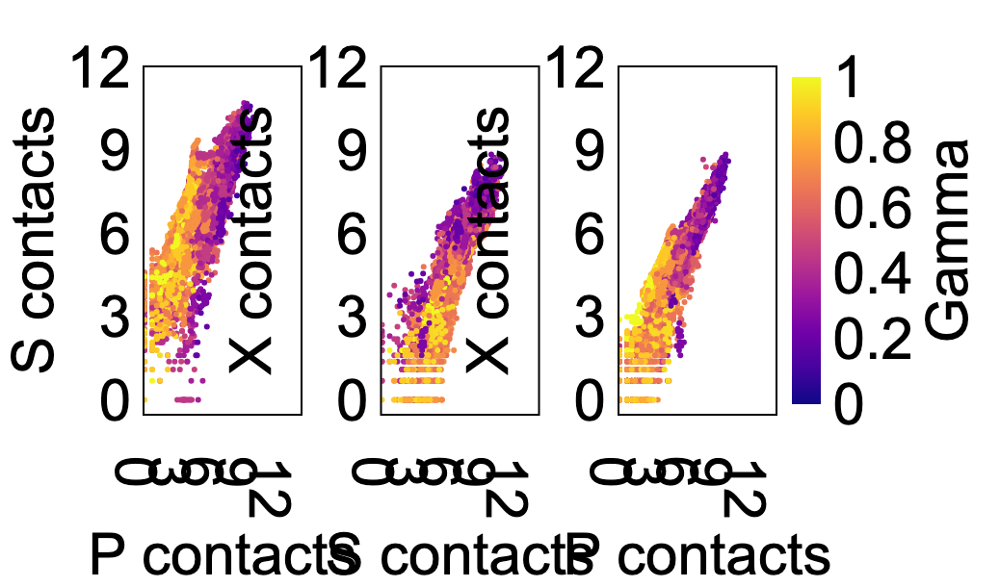

In [51]:
fig = make_subplots(rows=1, cols=3, horizontal_spacing=0.129)

colorscale = 'Plasma'  # or your choice

# Plot 1: scatter of log(P) vs log(S)
fig.add_trace(
    go.Scatter(
        x=excluded_merged_df["log(P)"],
        y=excluded_merged_df["log(S)"],
        mode='markers',
        marker=dict(
            color=excluded_merged_df["Gamma"],
            colorscale=colorscale,
            cmin=0,
            cmax=1,
            colorbar=dict(
                title='Gamma',
                title_side='right',
                title_font=dict(family="Arial", size=60, color="black"),
                tickfont=dict(family="Arial", size=60, color="black"),
                dtick=0.2,
                len=1,
                x=1.01,
                outlinewidth=0
            ),
            colorbar_len=1,
            size=6,
            showscale=True,
        ),
        hovertext=excluded_merged_df['Protid'],
        name=""
    ),
    row=1, col=1
)

# Plot 2: scatter of log(S) vs log(X)
fig.add_trace(
    go.Scatter(
        x=excluded_merged_df["log(S)"],
        y=excluded_merged_df["log(X)"],
        mode='markers',
        marker=dict(
            color=excluded_merged_df["Gamma"],
            colorscale=colorscale,
            cmin=0,
            cmax=1,
            size=6,
            showscale=False,
        ),
        hovertext=excluded_merged_df['Protid'],
        name=""
    ),
    row=1, col=2
)

# Plot 3: scatter of log(P) vs log(X)
fig.add_trace(
    go.Scatter(
        x=excluded_merged_df["log(P)"],
        y=excluded_merged_df["log(X)"],
        mode='markers',
        marker=dict(
            color=excluded_merged_df["Gamma"],
            colorscale=colorscale,
            cmin=0,
            cmax=1,
            size=6,
            showscale=False,),
        hovertext=average_merged_df['Protid'],
        name=""
    ),
    row=1, col=3
)

# Now update axis properties exactly as in your example:
TITLE_FONT_SIZE = 60
TICK_FONT_SIZE = 60

x_ranges = [[0, 14], [0, 14], [0, 14]]
y_ranges = [[-0.5, 12], [-0.5, 12], [-0.5, 12]]
x_titles = ["P contacts", "S contacts", "P contacts"]
y_titles = ["S contacts", "X contacts", "X contacts"]

for i in range(3):
    fig.update_xaxes(
        title=dict(text=x_titles[i], font=dict(family="Arial", size=TITLE_FONT_SIZE, color="black")),
        tickfont=dict(family="Arial", size=TICK_FONT_SIZE, color="black"),
        showgrid=False,
        zeroline=False,
        mirror=True,
        linecolor="black",
        dtick=3,
        linewidth=2,
        range=x_ranges[i],
        row=1, col=i+1
    )
    fig.update_yaxes(
        title=dict(text=y_titles[i], font=dict(family="Arial", size=TITLE_FONT_SIZE, color="black")),
        tickfont=dict(family="Arial", size=TICK_FONT_SIZE, color="black"),
        showgrid=False,
        zeroline=False,
        mirror=True,
        linecolor="black",
        dtick=3,
        linewidth=2,
        range=y_ranges[i],
        row=1, col=i+1
    )

fig.update_layout(
    plot_bgcolor="white",
    width=2000,
    height=610,
    margin=dict(l=80, r=50, t=70, b=70),
    showlegend=False,
)

fig.show()
# fig.write_image("/CT_analysis/results/images/CT_pred_gamma/PXS_v0.svg", scale=5)

## Prediction model gamma

In [50]:
# With one weight parameter : weight is the mean error of P, S and X
def sigmoid(X, pa, sa, xa, b):
    log_p = X[:, 0]
    log_s = X[:, 1]
    log_x = X[:, 2]
    return 1.0 / (1 + np.exp(-(pa * log_p + sa * log_s + xa * log_x +  b)))

X = excluded_merged_df[['log(P)', 'log(S)', 'log(X)']].values
y = excluded_merged_df['Gamma'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the sigmoid curve directly to the training data
popt, pcov = curve_fit(sigmoid, X_train, y_train,
                       p0=[0,0,0,0], 
                       bounds=((-np.inf,) * 4, (np.inf,) * 4), 
                       maxfev=5000)

# Get the coefficients
pa, sa, xa, b = popt
y_pred_sigmoid = sigmoid(X_test, *popt)
y_pred_sigmoid_train = sigmoid(X_train, *popt)

mse = mean_squared_error(y_test, y_pred_sigmoid)
r2_train = r2_score(y_train, y_pred_sigmoid_train)
r2 = r2_score(y_test, y_pred_sigmoid)

print(f"Mean Squared Error (Sigmoid Model): {mse:.4f}")
print(f"Test data R2 Score (Sigmoid Model): {r2:.4f}")
print(f"Train data R2 Score (Sigmoid Model): {r2_train:.4f}")
perr = np.sqrt(np.diag(pcov))

# Unpack errors
pa_err, sa_err, xa_err, b_err = perr

print(f"Sigmoid Model Coefficients:")
print(f"pa (for log(P)): {pa:.4f} ± {pa_err:.4f}")
print(f"sa (for log(S)): {sa:.4f} ± {sa_err:.4f}")
print(f"xa (for log(X)): {xa:.4f} ± {xa_err:.4f}")
print(f"b: {b:.4f} ± {b_err:.4f}")

Mean Squared Error (Sigmoid Model): 0.0168
Test data R2 Score (Sigmoid Model): 0.5912
Train data R2 Score (Sigmoid Model): 0.5934
Sigmoid Model Coefficients:
pa (for log(P)): -0.4935 ± 0.0098
sa (for log(S)): 0.1583 ± 0.0090
xa (for log(X)): 0.0479 ± 0.0135
b: 1.7507 ± 0.0317


### Plot pred vs test gamma

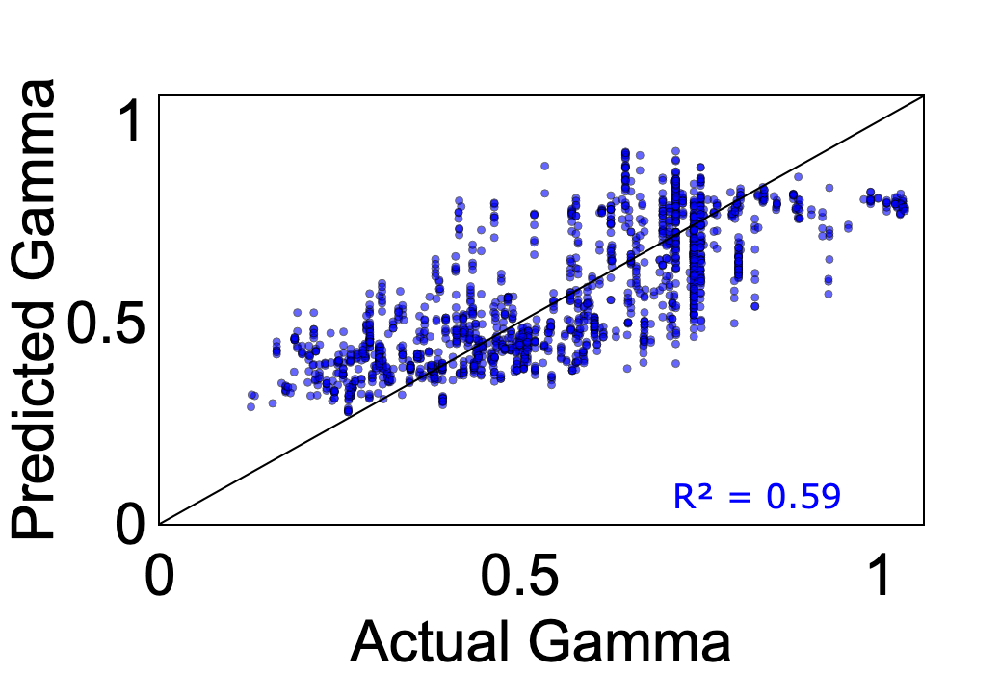

In [18]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=y_test,
    y=y_pred_sigmoid,
    mode='markers',
    marker=dict(
        color='blue',
        size=8,
        opacity=0.6,
        line=dict(color='black', width=1)
    )
))
# Identity line
fig.add_trace(go.Scatter(
    x=[0, 1.4],
    y=[0, 1.4],
    mode='lines',
    line=dict(color='black'),
    showlegend=False
))

fig = style_plot(
    fig,
    x_title="Actual Gamma",
    y_title="Predicted Gamma"
)

fig.update_layout(
    title=dict(
        font=dict(family="Arial", size=TITLE_FONT_SIZE, color="black"),
        x=0.5
    ),
    showlegend=False,
    width=720, height=700
)
fig.update_yaxes(
    showticklabels=True,
    dtick=0.5
)
fig.update_xaxes(
    showticklabels=True,
    dtick=0.5
)
fig.update_layout(
    xaxis=dict(range=[0, 1.06]),
    yaxis=dict(range=[0, 1.06])
)
fig.add_annotation(
    x=0.83, y=0.07,
    text=f"R² = 0.59",
    showarrow=False,
    font=dict(size=35, color='blue'),
    bgcolor="rgba(255, 255, 255, 0.7)",
    )
fig.show()
# fig.write_image("/CT_analysis/results/images/CT_pred_gamma/pred_score_test_gamma_v0.svg", scale=5)

### 3D plotting sigmoid prediction model

In [18]:
def sigmoid(X, pa, sa, xa, b):
    log_p = X[:, 0]
    log_s = X[:, 1]
    log_x = X[:, 2]
    return 1.0 / (1 + np.exp(-(pa * log_p + sa * log_s + xa * log_x + b)))

# Generate a grid
logP_vals = np.linspace(excluded_merged_df["log(P)"].min(), excluded_merged_df["log(P)"].max(), 20)
logS_vals = np.linspace(excluded_merged_df["log(S)"].min(), excluded_merged_df["log(S)"].max(), 20)
logX_vals = np.linspace(excluded_merged_df["log(X)"].min(), excluded_merged_df["log(X)"].max(), 20)

P, S, X = np.meshgrid(logP_vals, logS_vals, logX_vals)
grid_points = np.stack([P.ravel(), S.ravel(), X.ravel()], axis=-1)

# Evaluate sigmoid
Z = sigmoid(grid_points, pa=-0.494, sa=0.158, xa=0.05, b=1.75)

fig = go.Figure()

# Add smooth sigmoid surface
fig.add_trace(go.Mesh3d(
    x=grid_points[:, 1],
    y=grid_points[:, 2],
    z=grid_points[:, 0],
    intensity=Z,
    colorscale='Plasma',
    opacity=0.4,
    alphahull=17,
    showscale=False,
    colorbar=dict(
        title='Sigmoid',
        titleside='right',
        len=0.5,
        thickness=15,
        outlinewidth=0
    ),
))

# Add actual data points
fig.add_trace(go.Scatter3d(
    x=excluded_merged_df["log(S)"],
    y=excluded_merged_df["log(X)"],
    z=excluded_merged_df["log(P)"],
    mode='markers',
    marker=dict(
        size=4,
        color=excluded_merged_df['Gamma'],
        colorscale='Plasma',
        cmin=0,
        cmax=1,
        opacity=1,
        line=dict(width=1, color='black'),
        colorbar=dict(
            title='Gamma',
            titleside='right',
            dtick= 0.2,
            titlefont=dict(family='Arial', size=40),
            tickfont=dict(family='Arial', size=40),
            len=0.6,
            thickness=20,
            outlinewidth=0,
            x=0.9
        ),
    ),
    name='Data Points'
))

# Layout settings
fig.update_layout(
    width=700,
    height=450,
    font=dict(family='Arial', size=25, color='black'),
    scene=dict(
        xaxis=dict(
            title='ln(S)',
            range=[0, 10],
            showgrid=False,
            zeroline=False,
            showbackground=False,
            tickfont=dict(family='Arial', size=20),
            titlefont=dict(family='Arial', size=37),
            tickvals=[0,3,6,9],
            ticktext=[0,3,6,9],
            dtick=3,
        ),
        yaxis=dict(
            title='ln(X)',
            range=[0, 10],
            showgrid=False,
            zeroline=False,
            showbackground=False,
            tickfont=dict(family='Arial', size=20),
            titlefont=dict(family='Arial', size=37),
            tickvals=[0,3,6,9],
            ticktext=[0,3,6,9],
            dtick=3,
        ),
        zaxis=dict(
            title='ln(P)',
            range=[0, 10],
            showgrid=False,
            zeroline=False,
            showbackground=False,
            dtick=3,
            tickfont=dict(family='Arial', size=20),
            titlefont=dict(family='Arial', size=37),
            tickvals=[0,3,6,9],
            ticktext=[0,3,6,9],
        ),
        bgcolor='white'
    ),
    paper_bgcolor='white',
    margin=dict(l=0, r=0, b=0, t=0)
)
fig.update_layout(scene=dict(
    aspectmode='manual',
    aspectratio=dict(x=1, y=1., z=1.)
))
zoom_factor = 0.5  # less than 1 means zoom in

camera = dict(
    eye=dict(
        x=3.75 * zoom_factor,
        y=-3.75 * zoom_factor,
        z=1.95 * zoom_factor
    )
)
fig.update_layout(scene_camera=camera)

fig.show()
# fig.write_image('/CT_analysis/results/images/CT_pred_gamma/sigmoid_PSX_v0.svg')

### P,S,X vs predicted gamma

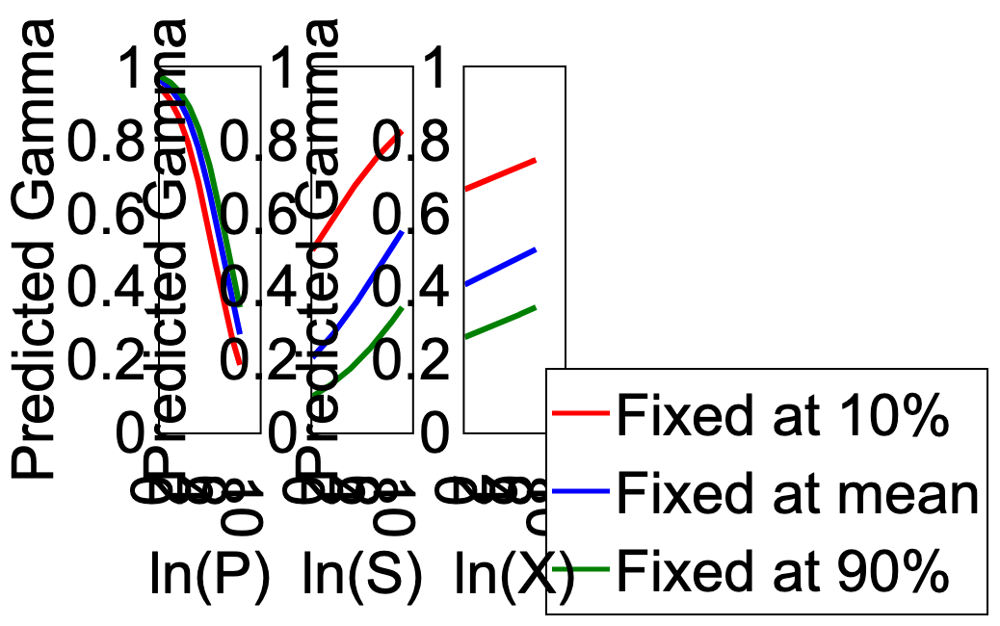

In [20]:
# Relationship P,S,X on predicted gamma is plotted, for every topological parameter, the other two parameters are fixated at 10, 50 and 90 percentile.
def sigmoid(X, pa, sa, xa, b):
    log_p = X[:, 0]
    log_s = X[:, 1]
    log_x = X[:, 2]
    return 1.0 / (1 + np.exp(-(pa * log_p + sa * log_s + xa * log_x + b)))

# Coefficients
pa, sa, xa, b = -0.494, 0.158, 0.05, 1.75

# Data ranges and means
low_p = np.percentile(average_merged_df["log(P)"], 10)
high_p = np.percentile(average_merged_df["log(P)"], 90)
mean_p = average_merged_df["log(P)"].mean()

low_s = np.percentile(average_merged_df["log(S)"], 10)
high_s = np.percentile(average_merged_df["log(S)"], 90)
mean_s = average_merged_df["log(S)"].mean()

low_x = np.percentile(average_merged_df["log(X)"], 10)
high_x = np.percentile(average_merged_df["log(X)"], 90)
mean_x = average_merged_df["log(X)"].mean()

p_min = average_merged_df["log(P)"].min()
p_max = average_merged_df["log(P)"].max()
s_min = average_merged_df["log(S)"].min()
s_max = average_merged_df["log(S)"].max()
x_min = average_merged_df["log(S)"].min()
x_max = average_merged_df["log(X)"].max()

# Generate values for the variable that varies
logP_vals = np.linspace(p_min, high_p, 100)
logS_vals = np.linspace(s_min, high_s, 100)
logX_vals = np.linspace(s_min, high_x, 100)

fig = sp.make_subplots(rows=1, cols=3, horizontal_spacing=0.13)

# Plot 1
fixed_S_vals = [low_s, mean_s, high_s]
fixed_X_vals = [low_x, mean_x, high_x]
colors = ['red', 'blue', 'green']
labels = ['Fixed at 10%', 'Fixed at mean', 'Fixed at 90%']

for fixed_S, fixed_X, color, label in zip(fixed_S_vals, fixed_X_vals, colors, labels):
    X = np.column_stack([logP_vals, np.full_like(logP_vals, fixed_S), np.full_like(logP_vals, fixed_X)])
    y = sigmoid(X, pa, sa, xa, b)
    fig.add_trace(go.Scatter(
        x=logP_vals, y=y, mode='lines',
        line=dict(color=color, width=6),  # Thicker line makes legend marker appear larger
        name=label,
        showlegend=True),
        row=1, col=1)

# Plot 2
fixed_P_vals = [low_p, mean_p, high_p]
fixed_X_vals = [low_x, mean_x, high_x]

for fixed_P, fixed_X, color, label in zip(fixed_P_vals, fixed_X_vals, colors, labels):
    X = np.column_stack([np.full_like(logS_vals, fixed_P), logS_vals, np.full_like(logS_vals, fixed_X)])
    y = sigmoid(X, pa, sa, xa, b)
    fig.add_trace(go.Scatter(
        x=logS_vals, y=y, mode='lines',
        line=dict(color=color, width=6),
        name=label,
        showlegend=False),
        row=1, col=2)

# Plot 3
fixed_P_vals = [low_p, mean_p, high_p]
fixed_S_vals = [low_s, mean_s, high_s]

for fixed_P, fixed_S, color, label in zip(fixed_P_vals, fixed_S_vals, colors, labels):
    X = np.column_stack([np.full_like(logX_vals, fixed_P), np.full_like(logX_vals, fixed_S), logX_vals])
    y = sigmoid(X, pa, sa, xa, b)
    fig.add_trace(go.Scatter(
        x=logX_vals, y=y, mode='lines',
        line=dict(color=color, width=6),
        name=label,
        showlegend=False),
        row=1, col=3)

TITLE_FONT_SIZE = 60
TICK_FONT_SIZE = 60

for i, var in enumerate(['ln(P)', 'ln(S)', 'ln(X)']):
    fig.update_xaxes(
        title=dict(text=var, font=dict(family="Arial", size=TITLE_FONT_SIZE, color="black")),
        tickfont=dict(family="Arial", size=TICK_FONT_SIZE, color="black"),
        showgrid=False,
        zeroline=False,
        mirror=True,
        linecolor="black",
        linewidth=2,
        dtick=2,
        range=[0, 11],
        row=1, col=i+1
    )
    fig.update_yaxes(
        title=dict(text='Predicted Gamma', font=dict(family="Arial", size=TITLE_FONT_SIZE, color="black")),
        tickfont=dict(family="Arial", size=TICK_FONT_SIZE, color="black"),
        showgrid=False,
        zeroline=False,
        mirror=True,
        linecolor="black",
        linewidth=2,
        dtick=0.2,
        range=[0, 1],
        row=1, col=i+1
    )

fig.update_layout(
    plot_bgcolor="white",
    showlegend=True,
    width=2850,
    height=650,
    legend=dict(
        orientation="v",
        x=1.5,
        xanchor="center",
        y=-0.5,
        font=dict(family="Arial", size=TICK_FONT_SIZE, color="black"),
        bordercolor="black",
        borderwidth=2,
        itemsizing="constant",
        itemwidth=60
    ),
    margin=dict(l=80, r=50, t=70, b=70),
)

fig.show()
# fig.write_image('/CT_analysis/results/images/CT_pred_gamma/sigmoid2D_PSX_v0.svg', scale=5)